# **Case Study #2 - Customer Orders Dataset**

## Created by: <u>Srikrishnan Veeraraghavan</u>

In [1]:
import pandas as pd
import numpy as np

In [2]:
customer_orders = pd.read_csv('casestudy.csv')

In [3]:
#Dropping Index
customer_orders = customer_orders.drop(customer_orders.columns[0],axis=1)

##### Suspecting that the text values in customer_email has extra leading spaces which might cause issues in calculations.

In [4]:
customer_orders.groupby('customer_email').nunique()

,net_revenue,year
customer_email,,
aaafxtkgxo@gmail.com,1,1
aaagldjgdt@gmail.com,1,1
aaaglfuvti@gmail.com,1,1
aaaicvtnzx@gmail.com,1,1
aaaiekepot@gmail.com,1,1
...,...,...
zzzoxtrfic@gmail.com,1,1
zzzrjsowtl@gmail.com,1,1
zzztwcvgvp@gmail.com,1,1


In [5]:
customer_orders['customer_email'] = customer_orders['customer_email'].str.strip()
customer_orders.groupby('customer_email').nunique()

,net_revenue,year
customer_email,,
aaaaaphwwy@gmail.com,1,1
aaabbviidb@gmail.com,1,1
aaaewsybit@gmail.com,1,1
aaafiismkd@gmail.com,1,1
aaafxtkgxo@gmail.com,2,2
...,...,...
zzzuzmfsii@gmail.com,1,1
zzzwmlwwmn@gmail.com,1,1
zzzxxclrua@gmail.com,1,1


##### There are some whitespaces in the email column that have now been removed. This will ensure more accurate calculations.

<br><br>

##### Moving on to the problem statements:

## 1) Total revenue for the current year

In [6]:
customer_orders.groupby('year').agg({'net_revenue':'sum'})

,net_revenue
year,
2015,29036749.19
2016,25730943.59
2017,31417495.03


## 2) New Customer Revenue e.g., new customers not present in previous year only

In [7]:
#Create cumulative count ordered by year i.e. if customer A is new in 2015, assign 1
#and if customer A is present in 2016 assign 2 and so on

customer_orders['cum_count'] = customer_orders.sort_values(['year','customer_email']).groupby('customer_email').cumcount()+1

#This variable cum_count will be useful for other problems too!

customer_orders[customer_orders['cum_count']==1].groupby('year').agg({'net_revenue':'sum'})

,net_revenue
year,
2015,2.903675e+07
2016,1.720637e+07
2017,2.176921e+07


## 3) Existing Customer Growth. To calculate this, use the Revenue of existing customers for current year –(minus) Revenue of existing customers from the previous year
## and
## 5) Existing Customer Revenue Current Year
## and
## 6) Existing Customer Revenue Previous Year

##### I'm not completely clear on the question 3. I have assumed that the question means: (Revenue of non new customers in current year) - (Revenue of those particular customers from the previous year)

In [8]:
#Filter out the existing customers (cumulative count != 1)
#For each customer email in the list, left join the previous year's revenue
#Calcuate difference between current revenue and previous year's revenue as growth

customer_orders_left = customer_orders.copy()
customer_orders_right = customer_orders.copy()

#Adding 1 to year so that previous year's revenue is joined to the current year's revenue
customer_orders_right['year'] = customer_orders_right['year'] + 1
customer_orders_left = pd.merge(customer_orders_left[(customer_orders_left['cum_count']!=1)], customer_orders_right, on=['customer_email','year'], how='left')


customer_orders_left = customer_orders_left.groupby('year').agg(current_revenue = ('net_revenue_x','sum'), prev_yr_revenue = ('net_revenue_y','sum'))
customer_orders_left['existing_cust_growth'] = customer_orders_left['current_revenue'] - customer_orders_left['prev_yr_revenue']

In [9]:
customer_orders_left

,current_revenue,prev_yr_revenue,existing_cust_growth
year,,,
2016,8524576.69,8485533.04,39043.65
2017,9648282.02,9584424.96,63857.06


## 4) Revenue lost from attrition
## and
## 10) Lost Customers

In [10]:
#Join next year's revenue for each customer
#If next_year's revenue is blank, customer has attrited
#If the customer has attrited, the current year's revenue is the revenue lost next year

customer_orders_left = customer_orders.copy()
customer_orders_right = customer_orders.copy()

#For joining next year's revenue
customer_orders_right['year'] = customer_orders_right['year'] - 1

customer_orders_left = pd.merge(customer_orders_left, customer_orders_right, on=['customer_email','year'], how='left')

#Sum up revenues for the year where next year's revenue for the customer is null
customer_orders_rev_lost = customer_orders_left[customer_orders_left['net_revenue_y'].isnull()].groupby('year',as_index=False).agg(attrition_revenue = ('net_revenue_x','sum'))

#Count of customers for the year where customer is missing next year
customer_orders_missing_cust = customer_orders_left[customer_orders_left['net_revenue_y'].isnull()].groupby('year',as_index=False).size()

#To display as next year's loss
customer_orders_rev_lost['year'] = customer_orders_rev_lost['year'] + 1

#Drop last row in dataframe as all revenue for the last year in the dataframe will be shown as lost
customer_orders_rev_lost = customer_orders_rev_lost.drop(index=customer_orders_rev_lost.index[-1],axis=0)

In [11]:
print("Revenue loss due to attrition: ")
customer_orders_rev_lost.head()

Revenue loss due to attrition: 


,year,attrition_revenue
0,2016,20551216.15
1,2017,16146518.63


In [12]:
print("Customers Lost each year: ")
#2017 shows all customers lost as there is no 2018 data
customer_orders_missing_cust.head()

Customers Lost each year: 


,year,size
0,2015,163539
1,2016,128108
2,2017,249987


## 5) Existing Customer Revenue Current Year

##### Refer question 3

## 6) Existing Customer Revenue Previous Year

##### Refer question 3

## 7) Total Customers Current Year
## and
## 8) Total Customers Previous Year

In [13]:
cust_count = customer_orders.groupby('year',as_index=False).size()
cust_count = cust_count.rename(columns={'size':'count_cust_curr_year'})

print("Total Customers Current Year: ")
print(cust_count)

#Assign Previous year's value to current year by looping in reverse

for i in range(len(cust_count)-1,0,-1):
    cust_count.loc[i, 'count_cust_curr_year'] = cust_count.loc[i-1, 'count_cust_curr_year']
    
cust_count.loc[0,'count_cust_curr_year'] = 0

cust_count = cust_count.rename(columns={'count_cust_curr_year':'count_cust_prev_year'})

print("\nTotal Customers Previous Year: ")
print(cust_count)

Total Customers Current Year: 
   year  count_cust_curr_year
0  2015                231294
1  2016                204646
2  2017                249987

Total Customers Previous Year: 
   year  count_cust_prev_year
0  2015                     0
1  2016                231294
2  2017                204646


## 9) New Customers

In [14]:
customer_orders[customer_orders['cum_count']==1].groupby('year',as_index=False).size().rename(columns={'size':'new_customers'})

,year,new_customers
0,2015,231294
1,2016,136891
2,2017,173449


## 10) Lost Customers

##### Refer question 4
<br><br>

## **_Insights from Data_**

In [15]:
#Import Plotly for visualizations

import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as pyo
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly
plotly.offline.init_notebook_mode(connected=True)

## Attrition Rate of Customers

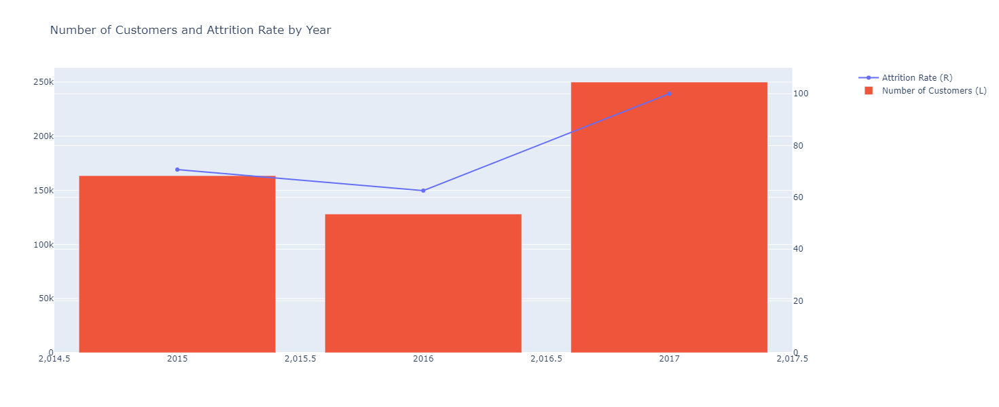

In [16]:
cust_count = customer_orders.groupby('year',as_index=False).size()
cust_count = cust_count.rename(columns={'size':'count_cust_curr_year'})

#Calculating attrition rate
attr = pd.merge(cust_count,customer_orders_missing_cust,on='year',how='inner')
attr['attrition_rate'] = attr['size']*100/attr['count_cust_curr_year']

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(x=attr.year,y=attr.attrition_rate,name="Attrition Rate (R)"),secondary_y=True)

fig.add_trace(go.Bar(x=attr.year,y=attr['size'],name="Number of Customers (L)"),secondary_y=False)

fig.update_layout(height=600,width=1000, title_text="Number of Customers and Attrition Rate by Year")

fig.update_yaxes(range=[0, 110], secondary_y=True)
fig.show()

#### The attrition rate of customers is quite high! It is decreasing in 2016 and it would be interesting to observe this trend over a longer period of time and identifying the reason for the high attrition. 

## New vs Existing Customer Proportion and Revenue

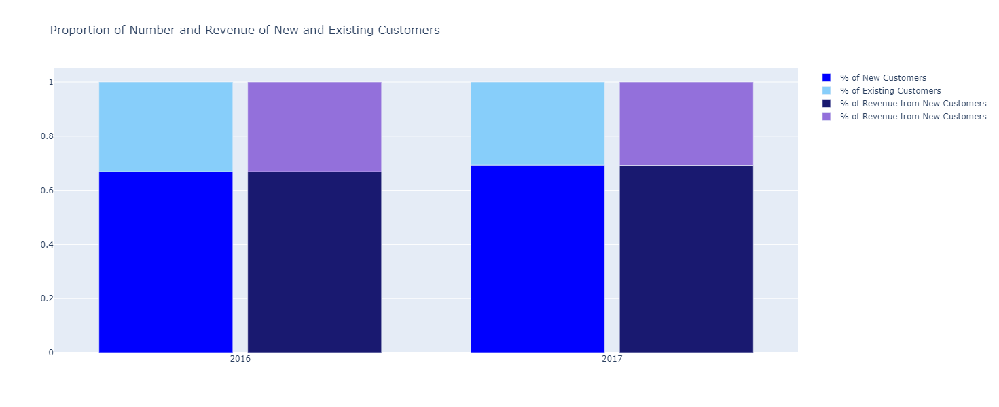

In [17]:
#Get proportion of new and existing customers

new_cust = customer_orders[customer_orders['cum_count']==1].groupby('year',as_index=False).size().rename(columns={'size':'new_customers'})

existing_cust = customer_orders[customer_orders['cum_count']!=1].groupby('year',as_index=False).size().rename(columns={'size':'existing_customers'})

total_cust = pd.merge(new_cust,existing_cust,on='year',how='inner')

total_cust['new_cust_perc'] = total_cust['new_customers']/(total_cust['new_customers']+total_cust['existing_customers'])
total_cust['existing_cust_perc'] = total_cust['existing_customers']/(total_cust['new_customers']+total_cust['existing_customers'])

#Get proportion of revenue from new and existing customers

new_cust_rev = customer_orders[customer_orders['cum_count']==1].groupby('year',as_index=False).agg(new_cust_rev = ('net_revenue','sum'))

existing_cust_rev = customer_orders[customer_orders['cum_count']!=1].groupby('year',as_index=False).agg(existing_cust_rev = ('net_revenue','sum'))

total_cust_rev = pd.merge(new_cust_rev,existing_cust_rev,on='year',how='inner')

total_cust_rev['new_cust_rev_perc'] = total_cust_rev['new_cust_rev']/(total_cust_rev['new_cust_rev']+total_cust_rev['existing_cust_rev'])
total_cust_rev['existing_cust_rev_perc'] = total_cust_rev['existing_cust_rev']/(total_cust_rev['new_cust_rev']+total_cust_rev['existing_cust_rev'])

#Plot side by side

fig = go.Figure(
    data = [
        go.Bar(x=total_cust['year'], y=total_cust['new_cust_perc'], offsetgroup=0, name='% of New Customers', marker = {'color' : 'blue'}),
        go.Bar(x=total_cust['year'], y=total_cust['existing_cust_perc'], offsetgroup=0, base=total_cust['new_cust_perc'], name='% of Existing Customers', marker = {'color' : 'LightSkyBlue'}),
        go.Bar(x=total_cust_rev['year'], y=total_cust_rev['new_cust_rev_perc'], offsetgroup=1, name='% of Revenue from New Customers', marker = {'color' : 'midnightblue'}),
        go.Bar(x=total_cust_rev['year'], y=total_cust_rev['existing_cust_rev_perc'], offsetgroup=1, base=total_cust_rev['new_cust_rev_perc'], name='% of Revenue from New Customers', marker = {'color' : 'mediumpurple'}),
    ]
)

fig.update_layout(height=600,width=1000,bargroupgap=0.1, title_text="Proportion of Number and Revenue of New and Existing Customers")


fig.show()


#### The percentage of new customers and the percentage of revenue from new customers is very similar. This indicates that there is no real value to retaining existing customers as long as new customers are sourced to replace the ones attriting.

## Distribution of Net Revenue of existing customers.

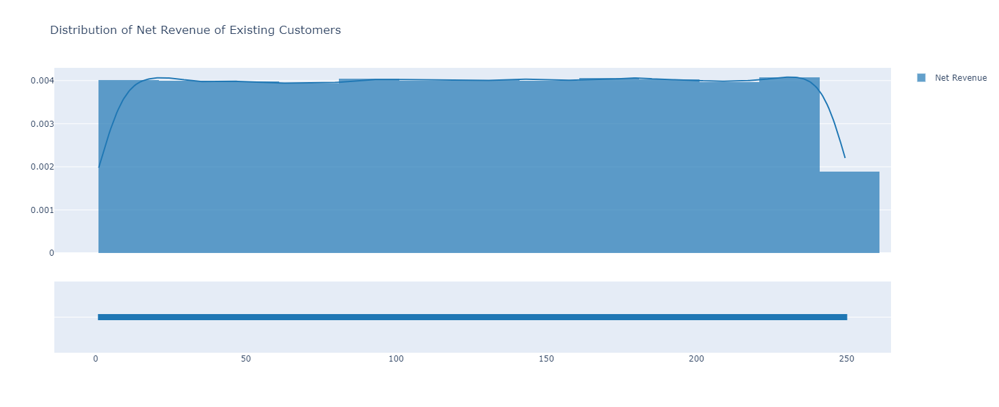

In [18]:
fig = ff.create_distplot([customer_orders[(customer_orders['cum_count']!=1)].net_revenue],
                         group_labels=['Net Revenue'], bin_size=20)

fig.update_layout(height=600,width=1000, title_text="Distribution of Net Revenue of Existing Customers")

fig.show()


#### We can see that the distribution of revenue is almost a uniform distribution, which is surprising as one would expect a quantity like this to be normally distributed.